# Imports

In [1]:
%reload_ext autoreload
%autoreload 2
# Python library
# !pip install dataprep
import math
import statistics
from abc import abstractmethod
import pickle
import IPython

# Machine learning
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy
from dataprep.eda import plot

In [2]:
# Where to find the files that I save
from paths import *

from utilities import *
init_plt()
init_tf()

# Parameters

In [3]:
# All parameters dictionary
NUMBER_OF_FEATURES = 50
p = {
    "experiment_type": "variable_ro",
    "experiment_name": "test",
    "k": 5,
    "enable_x_svd": False,
    "x_svd_polynomial_degree": 3,
    "select_young": False,
    "select_old": False,
    "override_weights_to_one": False,
    "enable_one_hot": True,
    
    "models_layers_and_parameters": {
        "weights": {
            "input_size": NUMBER_OF_FEATURES, # Do not change
            "layers":[
                # Format: (Size, Activation Function (None if none))
                # Last (output) layer should have size 1
                #(128, tf.nn.sigmoid),
                #(64, tf.nn.sigmoid),
                (32, tf.nn.sigmoid),
                (32, tf.nn.sigmoid),
                (1, None)
            ],
            "learning_rate": 1e-3,
            "training_steps": 5000,
            "dropout": 0.2,
            "display_step": 1000,
        },

        "fhat": {
            "input_size": NUMBER_OF_FEATURES, # Do not change
            "layers":[
                # Format: (Size, Activation Function (None if none))
                # Last (output) layer should have size 1
                #(128, tf.nn.sigmoid),
                #(64, tf.nn.sigmoid),
                (32, tf.nn.sigmoid),
                (32, tf.nn.sigmoid),
                (4, None)
            ],
            "learning_rate": 1e-3,
            "training_steps": 5000,
            "dropout": 0.2,
            "display_step": 1000,

            "resample_data": False,
            "resampled_points_per_category": 10000,
        },
        
        "rho": {
            "input_size": NUMBER_OF_FEATURES, # Do not change
            "layers":[
                # Format: (Size, Activation Function (None if none))
                # Last (output) layer should have size 1
                #(128, tf.nn.sigmoid),
                #(64, tf.nn.sigmoid),
                (1, None)
            ],
            "learning_rate": 1e-3,
            "training_steps": 5000,
            "dropout": 0.2,
            "display_step": 1000,

            #"resample_data": False,
            #"resampled_points_per_category": 10000,
        }
    }
}


assert(not (p["select_young"] and p["select_old"])) # Make sure both are not selected
OUTPUT_FOLDER = GENERAL_RESULTS_FOLDER + p["experiment_name"] + SLASH
DISPLAY_STEP = 1000

# Make the folder where the results will be placed in

In [4]:
# Make the directory to store the files
! mkdir $OUTPUT_FOLDER

mkdir: cannot create directory ‘results/test/’: File exists


# Data preparation

In [5]:
# Load entire data file
data = np.loadtxt(DATA_PATH).astype(np.float64)

# Shuffle data
np.random.shuffle(data)

young_mask = data[:, 0]==1
old_mask = data[:, 0]==2

# Select young or old
if p["select_young"]:
    print("We selected only young.")
    data = data[young_mask]
if p["select_old"]:
    print("We selected only old.")
    data = data[old_mask]

In [6]:
# Divide data into training, test, cross_validation
samples_per_fold = math.floor(data.shape[0]/p["k"])
samples = samples_per_fold*p["k"]
print("Samples:", samples)
bounds = list(map(lambda x: (x, x+samples_per_fold), list(range(0, samples_per_fold*p["k"], samples_per_fold))))

data = data[:p["k"]*samples_per_fold] # This is all we can use
young_mask = young_mask[:p["k"]*samples_per_fold]
old_mask = old_mask[:p["k"]*samples_per_fold]

Samples: 6330


In [7]:
number_of_samples = data.shape[0]

if p["enable_one_hot"]:
    def make_one_hot(x):
        unique = list(set(x))
        convert_to_index = np.vectorize(lambda x: unique.index(x))
    
        one_hot = np.zeros((number_of_samples, len(unique)))
        one_hot[np.arange(number_of_samples), convert_to_index(x)] = 1
        
        return one_hot[:, :-1]
else:
    def make_one_hot(x):
        return np.expand_dims(x, axis=1) # Do nothing, just add a dimension
    

def extract(data):
    
    age = (data[:, 0]==2).astype(np.float64)
    group = data[:, 21] # 
    hom = data[:,23]
    prof  = data[:, 43]; #
    reg = data[:, 46] #
    rena = data[:, 47]
    tracir = data[:, 52] #
    trage = data[:, 53] # 
    usag = data[:,56] # 
    zone = data[:, 57] #
        
    y_1 = (data[:, 9] > 0).astype(np.float64)
    y_2 = (data[:, 24] == 0).astype(np.float64)
    weights = data[:, 42]
        
    # Convert These variables to ones and zeros
    list_categorical_variables = \
        list(map(make_one_hot, [group, prof, reg, tracir, trage, usag, zone]))

    # Do not convert these (they only take values 0 and 1)
    add_dim = lambda x: np.expand_dims(x, axis=1)
    list_other_variables = \
        list(map(add_dim, [hom, rena, age]))
    
        
    # Just add here
    return np.concatenate(list_categorical_variables+list_other_variables, axis=1), \
           add_dim(y_1), \
           add_dim(y_2), \
           add_dim(weights)

X, y_1, y_2, weights = extract(data)
print(X.shape)

(6330, 50)


In [8]:
# Normalize X

if not p["enable_one_hot"]:
    divide_by_std_dev = lambda x: x/np.std(x, axis=0, keepdims=True)
    subtract_mean = lambda x: x-np.mean(x, axis=0, keepdims=True)

    X = divide_by_std_dev(subtract_mean(X))

In [9]:
t = lambda x: np.squeeze(x, axis=1)

f00 = ((y_1 == 0) & (y_2 == 0)).astype(np.float64)
f01 = ((y_1 == 0) & (y_2 == 1)).astype(np.float64)
f10 = ((y_1 == 1) & (y_2 == 0)).astype(np.float64)
f11 = ((y_1 == 1) & (y_2 == 1)).astype(np.float64)

f = np.empty((y_1.shape[0], 4), dtype=np.float64)
f[:, 0] = t(f00)
f[:, 1] = t(f01)
f[:, 2] = t(f10)
f[:, 3] = t(f11)

In [10]:
from neural_network import create_neural_network
class NNModel():

    def __init__(self, model_layers_and_parameters):
        self.parameters = model_layers_and_parameters
        apply_network, variables, _ = create_neural_network(model_layers_and_parameters)
        self.variables = variables
        self.nn_layers = apply_network
        self.optimizer = tf.keras.optimizers.Adam(learning_rate=model_layers_and_parameters["learning_rate"])

    #@tf.function(experimental_relax_shapes=True)
    @abstractmethod # Means this function must be implemented
    def run(self, inp, training):
        pass 

    def train_one_step(self, inp, variables, optimizer):
        with tf.GradientTape() as tape:
            output = self.run(inp, training=True)

        loss = output["loss"]
        grads = tape.gradient(loss, variables)
        optimizer.apply_gradients(zip(grads, variables)) 
        
        return output

    def train(self, inp):
        training_steps = self.parameters["training_steps"]
        train_one_step = self.train_one_step
        variables = self.variables
        optimizer = self.optimizer
        for i in range(training_steps):
            output = train_one_step(inp, variables, optimizer)
            
            if i % DISPLAY_STEP == 0:
                print("Step", i, "loss is", output["loss"].numpy())
            

        return self.run(inp, training=False)

# Models

In [11]:
class WeightModel(NNModel):
    
    # This the run function we had to implement
    #@tf.function(experimental_relax_shapes=True)
    def run(self, inp, training):
        output_unsigmoided, _ = self.nn_layers(inp["X"], training=training)
        output_sigmoided = tf.sigmoid(output_unsigmoided)
        cross_entropy = tf.nn.sigmoid_cross_entropy_with_logits(labels=inp["weights"], logits=output_unsigmoided)
        loss = tf.reduce_mean(cross_entropy)
        return {
            "weights_predicted": output_sigmoided, 
            "loss": loss
        }
    
class FhatModel(NNModel):
    
    # This the run function we had to implement
    #@tf.function(experimental_relax_shapes=True)
    def run(self, inp, training):
        
        unsoftmaxed, _ = self.nn_layers(inp["X"], training=training)
        softmaxed = tf.nn.softmax(unsoftmaxed, axis=1)
        softmaxed = softmaxed / tf.reduce_sum(softmaxed, axis=1, keepdims=True)
        weights_squeezed = tf.squeeze(inp["weights"], axis=1)
        
        
        entropied = tf.nn.sparse_softmax_cross_entropy_with_logits(labels=tf.math.argmax(inp["f"], axis=1), \
                                                                   logits=unsoftmaxed)
        loss = tf.reduce_mean(weights_squeezed*entropied)
        accuracy = 100.0*tf.reduce_mean(tf.cast(tf.math.equal(tf.math.argmax(softmaxed, axis=1), \
                                                              tf.math.argmax(inp["f"], axis=1)), tf.float32))
                
        f_list = tf.unstack(tf.expand_dims(softmaxed, axis=2), axis=1)
        fhat00 = f_list[0]
        fhat01 = f_list[1]
        fhat10 = f_list[2]
        fhat11 = f_list[3]
        
        return {
            "unsoftmaxed": unsoftmaxed,
            "softmaxed": softmaxed,
            "accuracy": accuracy,
            "loss": loss,
            "fhat00": fhat00, 
            "fhat01": fhat01, 
            "fhat10": fhat10, 
            "fhat11": fhat11,
        }
    
class RhoModel(NNModel):
    
    # This the run function we had to implement
    #@tf.function(experimental_relax_shapes=True)
    def run(self, inp, training):
        X, y_1, y_2, f00, f01, f10, f11, fhat00, fhat01, fhat10, fhat11, weights = \
            map(lambda name: inp[name], 
                ["X", "y_1", "y_2", "f00", "f01", "f10", "f11", \
                "fhat00", "fhat01", \
                "fhat10", "fhat11", \
                "weights"])
        
        rho_x, _ = self.nn_layers(X, training=training)
        
        phat = fhat10+fhat11
        qhat = fhat01+fhat11
        Rhat = tf.math.sqrt(phat*(1-phat)*qhat*(1-qhat))
        
        Rhat01 = phat*(1-phat)*(1-2*qhat)/(2*Rhat)
        Rhat10 = qhat*(1-qhat)*(1-2*phat)/(2*Rhat)
        Rhat11 = Rhat01+Rhat10
        That01 = Rhat01*Rhat
        That10 = Rhat10*Rhat
        That11 = Rhat11*Rhat
        
        #Rhat01 = phat*(1-phat)*(1-2*qhat)/2
        #Rhat10 = qhat*(1-qhat)*(1-2*phat)/2
        #Rhat11 = Rhat01+Rhat10

        m = weights*((y_1-phat)*(y_2-qhat)-rho_x*Rhat)
        m01 = weights*((1-y_1)*y_2-fhat01)
        m10 = weights*(y_1*(1-y_2)-fhat10)
        m11 = weights*(y_1*y_2-fhat11)

        X_with_ones = tf.concat([tf.ones_like(y_1), X], axis=1)
        X_with_ones_unstacked = tf.unstack(X_with_ones, axis=1)
        
        samples = y_1.shape[0]
        X_size = X_with_ones.shape[1]
        
        #derivative = tf.ones_like(rho_x)
        
        K = (Rhat**2*weights)/(Rhat**2+rho_x**2*(That01**2+That10**2+That11**2)) # rho_x squared here change 9/18
        phi = K*(rho_x*(That01*m01+That10*m10+That11*m11)-Rhat*m)
        
        #loss = tf.reduce_mean(phi)**2
        
        def Q_i(i):
            X_i = tf.expand_dims(X_with_ones_unstacked[i], axis=1)
            K_i = (Rhat**2*weights*X_i)/(Rhat**2+rho_x**2*(That01**2+That10**2+That11**2)) # and here as well 
            phi_i = K_i*(rho_x*(That01*m01+That10*m10+That11*m11)-Rhat*m)
            return phi_i
            
            #mu_4_i = - (weights*Rhat*derivative*X_i)/(1+rho_x**2*(Rhat01**2+Rhat10**2+Rhat11**2))
            #mu_4_i = - (weights*(Rhat**2)*derivative*X_i)/((Rhat**2) + (rho_x**2)*((Rhat01**2) + (Rhat10**2) + (Rhat11**2)))
            #return mu_4_i * (rho_x*(Rhat01*m01+Rhat10*m10+Rhat11*m11)-weights*(y_1-phat)*(y_2-qhat))
            
            #return mu_4_i * (rho_x*(Rhat01*m01+Rhat10*m10+Rhat11*m11)-m) # NEW
            
            # Q_i_output = mu_4_i * (rho_x*((Rhat01*m01) + (Rhat10*m10) +(Rhat11*m11)) - Rhat * weights*(y_1-phat)*(y_2-qhat))
            ##################################################
            # !!!!!!!!!!!! CHANGED BELOW !!!!!!!!!!!!!!!!!!  #
            ##################################################
            #Q_i_output = mu_4_i * (rho_x*((Rhat01*m01) + (Rhat10*m10) +(Rhat11*m11)) - Rhat * m)
            #return Q_i_output
            
        Q_list = [Q_i(i) for i in range(X_size)]

        Q_concat = tf.squeeze(tf.stack(Q_list, axis=1), axis=2) # n x 50
        Q_summed_across_samples = tf.reduce_sum(Q_concat, axis=0, keepdims=True) # 1 x 50
        loss = tf.reduce_mean(Q_summed_across_samples**2) # 

        rho_x_estimate = Rhat*m / (That01*m01+That10*m10+That11*m11)
        
        # Phi
        #mu_4_phi = (weights*Rhat*derivative)/(1+rho_x**2*(Rhat01**2+Rhat10**2+Rhat11**2))
        #mu_4_phi = (weights*(Rhat**2)*derivative)/((Rhat**2) + (rho_x**2)*((Rhat01**2) + (Rhat10**2) + (Rhat11**2)))
        
        #phi = mu_4_phi * (rho_x*(Rhat01*m01+Rhat10*m10+Rhat11*m11)-weights*(y_1-phat)*(y_2-qhat))
        # phi = mu_4_phi * (rho_x*(Rhat01*m01+Rhat10*m10+Rhat11*m11) - Rhat * weights*(y_1-phat)*(y_2-qhat))
        ##################################################
        # !!!!!!!!!!!! CHANGED BELOW !!!!!!!!!!!!!!!!!!  #
        ##################################################
        # phi = mu_4_phi * (rho_x*((Rhat01*m01) + (Rhat10*m10) +(Rhat11*m11)) - Rhat * m) OLD WORKING
        #phi = mu_4_phi * (rho_x*((Rhat01*m01) + (Rhat10*m10) +(Rhat11*m11)) - m)

        
        output = {
            "rho_x": rho_x,
            "rho_x_estimate": rho_x_estimate,
        
            "phat": phat,
            "qhat": qhat,
            "Rhat": Rhat,
            "Rhat01": Rhat01, 
            "Rhat10": Rhat10, 
            "Rhat11": Rhat11,
            "m": m,
            "m01": m01,
            "m10": m10,
            "m11": m11,

            #"Q_summed_across_samples": Q_summed_across_samples,
            #"Q_concat": Q_concat,
            "phi": phi,
            "loss": loss,
            
        }
        # Some test to check what in our loss is not a number
        #print({k: np.isnan(v.numpy()).any() for k,v in output.items()})
        return output

# Weights model training

In [12]:
# Remember the old ones
if "weights_original" not in locals().keys(): # If we haven't defined weights_original already
    weights_original = weights 

# Predict weights
if p["override_weights_to_one"]:
    weights = np.ones_like(weights)
else:
    weights = np.empty_like(weights)

    for k in range(p["k"]):

        lower, upper = bounds[k]
        get_kth = lambda x: x[lower:upper]
        cut_kth = lambda x: np.concatenate([x[:lower], x[upper:]], axis=0)
        X_kth, weights_kth = list(map(get_kth, [X, weights_original]))
        X_rest, weights_rest = list(map(cut_kth, [X, weights_original]))

        # Reset graph
        tf.keras.backend.clear_session()
        
        model = WeightModel(p["models_layers_and_parameters"]["weights"])
        
        inp = dict_to_tensors({"X": X_rest, "weights": weights_rest})
        _ = model.train(inp)
        
        inp = dict_to_tensors({"X": X_kth, "weights": weights_kth})
        output_kth = model.run(inp, training=False)
        print(f"Final loss on fold {k}:", output_kth["loss"].numpy())
        weights[lower:upper] = output_kth["weights_predicted"].numpy() # Replace weights with predicted ones

Step 0 loss is 0.6917411486390869
Step 1000 loss is 0.6308928754535118
Step 2000 loss is 0.6227810676000133
Step 3000 loss is 0.6247339398441266
Step 4000 loss is 0.6225903581164158
Final loss on fold 0: 0.6329470672126215
Step 0 loss is 0.6916769956350133
Step 1000 loss is 0.6303814287735132
Step 2000 loss is 0.624904704258011
Step 3000 loss is 0.6193686407380082
Step 4000 loss is 0.6211191257603359
Final loss on fold 1: 0.6347880392929557
Step 0 loss is 0.6915351334922816
Step 1000 loss is 0.6329612989669945
Step 2000 loss is 0.6236383209151197
Step 3000 loss is 0.6273819096573163
Step 4000 loss is 0.6200839535990039
Final loss on fold 2: 0.6269537050986891
Step 0 loss is 0.691460599803174
Step 1000 loss is 0.6325309730910426
Step 2000 loss is 0.627026505457501
Step 3000 loss is 0.625334653788538
Step 4000 loss is 0.6227664358958049
Final loss on fold 3: 0.6228876968563287
Step 0 loss is 0.6912915797160789
Step 1000 loss is 0.6346975492622459
Step 2000 loss is 0.6290909988540508
Step

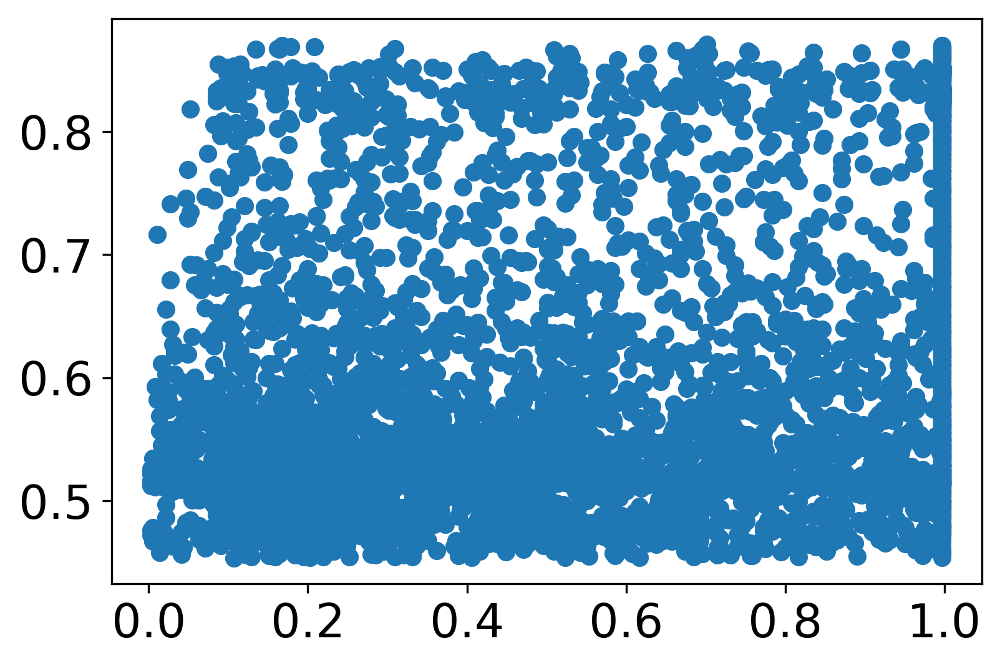

In [13]:
# Scatterplot
plt.scatter(weights_original, weights)

# Fhat model training

In [14]:
fhats = {"fhat00":np.zeros((samples, 1), dtype=np.float64),
         "fhat01":np.zeros((samples, 1), dtype=np.float64),
         "fhat10":np.zeros((samples, 1), dtype=np.float64),
         "fhat11":np.zeros((samples, 1), dtype=np.float64)}
    
for k in range(p["k"]):
    
    print("K:", k)
        
    # Cut out part of kth fold
    lower, upper = bounds[k]
    get_kth = lambda x: x[lower:upper]
    cut_kth = lambda x: np.concatenate([x[:lower], x[upper:]], axis=0)
    X_kth, f_kth, weights_kth = list(map(get_kth, [X, f, weights]))
    X_rest, f_rest, weights_rest = list(map(cut_kth, [X, f, weights]))
        
    if p["models_layers_and_parameters"]["fhat"]["resample_data"]:
        resampled_points_per_category = p["models_layers_and_parameters"]["fhat"]["resampled_points_per_category"]
            
        indexes00 = np.where(f_rest[:, 0] == 1)[0]
        indexes01 = np.where(f_rest[:, 1] == 1)[0]
        indexes10 = np.where(f_rest[:, 2] == 1)[0]
        indexes11 = np.where(f_rest[:, 3] == 1)[0]
        chosen00 = indexes00[np.random.randint(0, indexes00.shape[0], size=resampled_points_per_category)]
        chosen01 = indexes01[np.random.randint(0, indexes01.shape[0], size=resampled_points_per_category)]
        chosen10 = indexes10[np.random.randint(0, indexes10.shape[0], size=resampled_points_per_category)]
        chosen11 = indexes11[np.random.randint(0, indexes11.shape[0], size=resampled_points_per_category)]

        X_train = np.concatenate([
            X_rest[chosen00],
            X_rest[chosen01],
            X_rest[chosen10],
            X_rest[chosen11]
        ], axis=0)
        f_train = np.concatenate([
            f_rest[chosen00],
            f_rest[chosen01],
            f_rest[chosen10],
            f_rest[chosen11]
        ], axis=0)
        weights_train = np.concatenate([
            weights_rest[chosen00],
            weights_rest[chosen01],
            weights_rest[chosen10],
            weights_rest[chosen11]
        ], axis=0)
    else:
        X_train, f_train, weights_train = [X_rest, f_rest, weights_rest]
                    
        
    # Reset graph
    tf.keras.backend.clear_session()
    
    model = FhatModel(p["models_layers_and_parameters"]["fhat"])
        
    inp_train = dict_to_tensors({"X": X_train, "f": f_train, "weights": weights_train})
    _ = model.train(inp_train)
    final_output = model.run(inp_train, training=False)
    
    print("Final loss on training data (could be resampled) is", final_output["loss"].numpy())
    print("Final accuracy on training_data (could be resampled) is", final_output["accuracy"].numpy())

    inp_rest = dict_to_tensors({"X": X_rest, "f": f_rest, "weights": weights_rest})
    output_rest = model.run(inp_rest, training=False)
        
    print("Final accuracy on 4/5 data (not resampled) is", output_rest["accuracy"].numpy())
        
    inp_kth = dict_to_tensors({"X": X_kth, "f": f_kth, "weights": weights_kth})
    output_kth = model.run(inp_kth, training=False)
    
    print("Final accuracy on kth fold (not resampled, we never resample this) is", output_kth["accuracy"].numpy())
        
    for variable_name in fhats.keys():
        fhats[variable_name][lower:upper] = output_kth[variable_name]
    
        
    indexes00 = f_kth[:, 0] == 1
    indexes01 = f_kth[:, 1] == 1
    indexes10 = f_kth[:, 2] == 1
    indexes11 = f_kth[:, 3] == 1
        
    inp_00 = dict_to_tensors({"X": X_kth[indexes00], "f": f_kth[indexes00], "weights": weights_kth[indexes00]})
    output_00 = model.run(inp_00, training=False)
        
    print(f"Final accuracy on fold {k} with y_1 = 0 y_2 = 0: ", output_00["accuracy"].numpy())
        
    inp_01 = dict_to_tensors({"X": X_kth[indexes01], "f": f_kth[indexes01], "weights": weights_kth[indexes01]})
    output_01 = model.run(inp_01, training=False)
        
    print(f"Final accuracy on fold {k} with y_1 = 0 y_2 = 1: ", output_01["accuracy"].numpy())
        
    inp_10 = dict_to_tensors({"X": X_kth[indexes10], "f": f_kth[indexes10], "weights": weights_kth[indexes10]})
    output_10 = model.run(inp_10, training=False)
        
    print(f"Final accuracy on fold {k} with y_1 = 1 y_2 = 0: ", output_10["accuracy"].numpy())
    
    inp_11 = dict_to_tensors({"X": X_kth[indexes11], "f": f_kth[indexes11], "weights": weights_kth[indexes11]})
    output_11 = model.run(inp_11, training=False)
        
    print(f"Final accuracy on fold {k} with y_1 = 1 y_2 = 1: ", output_11["accuracy"].numpy())

K: 0
Step 0 loss is 0.8533015845420967
Step 1000 loss is 0.5461450032195517
Step 2000 loss is 0.416302468305366
Step 3000 loss is 0.40783988869718996
Step 4000 loss is 0.41641342940818354
Final loss on training data (could be resampled) is 0.39843191468682765
Final accuracy on training_data (could be resampled) is 76.83649
Final accuracy on 4/5 data (not resampled) is 76.83649
Final accuracy on kth fold (not resampled, we never resample this) is 76.54028
Final accuracy on fold 0 with y_1 = 0 y_2 = 0:  87.5


5 out of the last 5006 calls to <function create_neural_network.<locals>.apply_network at 0x7f9ceebe1c10> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


Final accuracy on fold 0 with y_1 = 0 y_2 = 1:  0.0


6 out of the last 5007 calls to <function create_neural_network.<locals>.apply_network at 0x7f9ceebe1c10> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


Final accuracy on fold 0 with y_1 = 1 y_2 = 0:  72.10884
Final accuracy on fold 0 with y_1 = 1 y_2 = 1:  0.0
K: 1
Step 0 loss is 0.859393270111172
Step 1000 loss is 0.5408778144384603
Step 2000 loss is 0.4262765694623997
Step 3000 loss is 0.4055005005325035
Step 4000 loss is 0.40244556203450754
Final loss on training data (could be resampled) is 0.40208478245615636
Final accuracy on training_data (could be resampled) is 76.797
Final accuracy on 4/5 data (not resampled) is 76.797
Final accuracy on kth fold (not resampled, we never resample this) is 76.935234
Final accuracy on fold 1 with y_1 = 0 y_2 = 0:  87.17599
Final accuracy on fold 1 with y_1 = 0 y_2 = 1:  0.0
Final accuracy on fold 1 with y_1 = 1 y_2 = 0:  76.48402
Final accuracy on fold 1 with y_1 = 1 y_2 = 1:  0.0
K: 2
Step 0 loss is 0.8566367760404312
Step 1000 loss is 0.564687784129743
Step 2000 loss is 0.42184932032646855
Step 3000 loss is 0.4122854808745609
Step 4000 loss is 0.41006608349528983
Final loss on training data (c

In [15]:
indexes00 = f[:, 0] == 1
indexes01 = f[:, 1] == 1
indexes10 = f[:, 2] == 1
indexes11 = f[:, 3] == 1

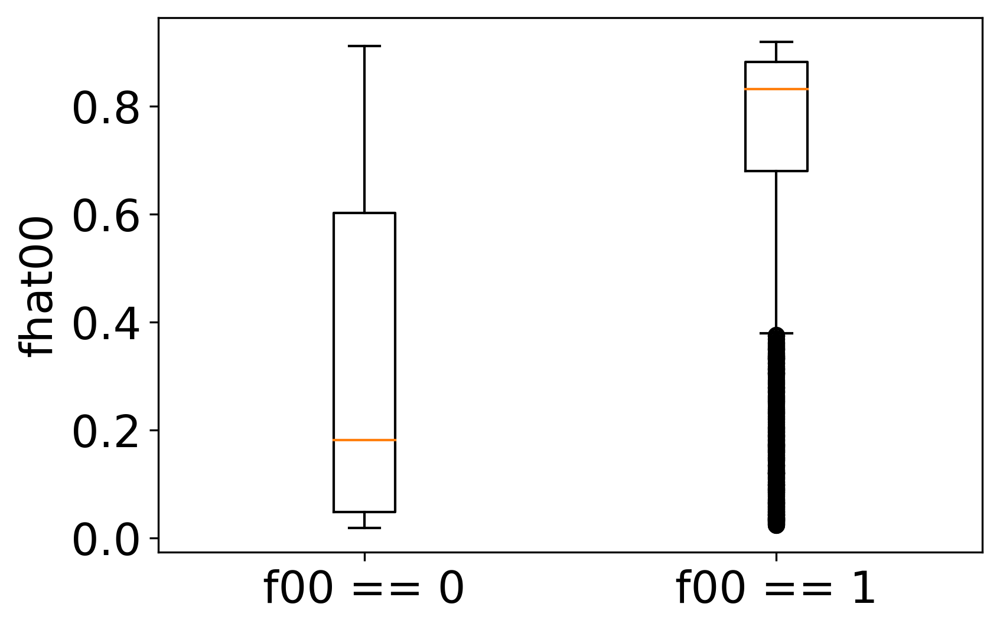

In [16]:
ax = plt.axes()

plt.boxplot(fhats["fhat00"][np.invert(indexes00)], positions=[0])
plt.boxplot(fhats["fhat00"][indexes00], positions=[1])

ax.set_xticklabels(['f00 == 0', 'f00 == 1'])
ax.set_xticks([0, 1])
_ = plt.ylabel('fhat00')

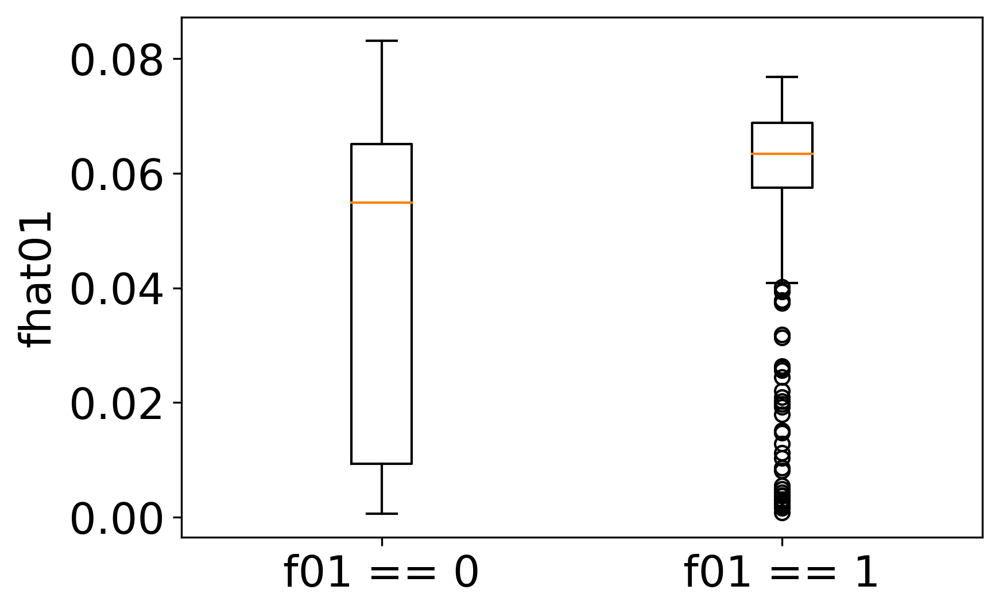

In [17]:
ax = plt.axes()

plt.boxplot(fhats["fhat01"][np.invert(indexes01)], positions=[0])
plt.boxplot(fhats["fhat01"][indexes01], positions=[1])

ax.set_xticklabels(['f01 == 0', 'f01 == 1'])
ax.set_xticks([0, 1])
_ = plt.ylabel('fhat01')

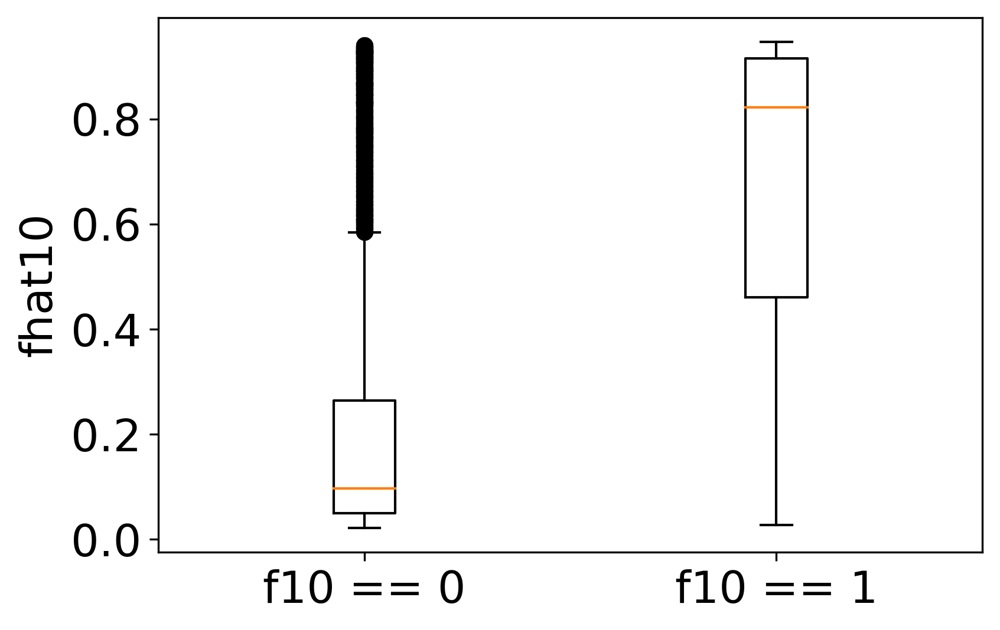

In [18]:
ax = plt.axes()

plt.boxplot(fhats["fhat10"][np.invert(indexes10)], positions=[0])
plt.boxplot(fhats["fhat10"][indexes10], positions=[1])

ax.set_xticklabels(['f10 == 0', 'f10 == 1'])
ax.set_xticks([0, 1])
_ = plt.ylabel('fhat10')

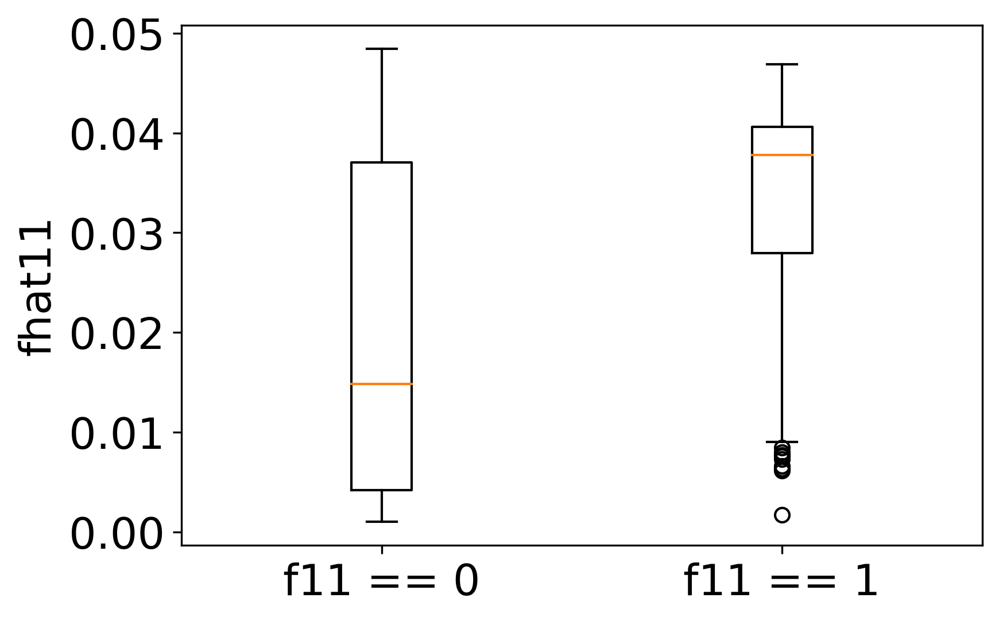

In [19]:
ax = plt.axes()

plt.boxplot(fhats["fhat11"][np.invert(indexes11)], positions=[0])
plt.boxplot(fhats["fhat11"][indexes11], positions=[1])

ax.set_xticklabels(['f11 == 0', 'f11 == 1'])
ax.set_xticks([0, 1])
_ = plt.ylabel('fhat11')

In [20]:
# X SVD

if p["enable_x_svd"]:
    X_0, X_1, X_2, X_3, X_4, X_5, X_6, X_7, X_8, X_9 = \
            map(lambda i: np.expand_dims(X[:, i], 1), range(10))
    polynomial_degree = p["x_svd_polynomial_degree"]
    X_polynomial = np.concatenate([
        X_0**d0*X_1**d1*X_2**d2*X_3**d3*X_4**d4*X_5**d5*X_6**d6*X_7**d7*X_8**d8*X_9**d9
        for d0 in range(polynomial_degree+1)
        for d1 in range(polynomial_degree+1)
        for d2 in range(polynomial_degree+1)
        for d3 in range(polynomial_degree+1)
        for d4 in range(polynomial_degree+1)
        for d5 in range(polynomial_degree+1)
        for d6 in range(polynomial_degree+1)
        for d7 in range(polynomial_degree+1)
        for d8 in range(polynomial_degree+1)
        for d9 in range(polynomial_degree+1)
        if d0+d1+d2+d3+d4+d5+d6+d7+d8+d9<=polynomial_degree
    ], axis=1)

    u_svd, s_diagonal, vh_svd = np.linalg.svd(X_polynomial, full_matrices=True)
    s_svd = np.diag(s_diagonal)
    s_diagonal_mean = s_diagonal/np.sum(s_diagonal)
    sum_diagonal = 0
    for index in range(s_diagonal_mean.shape[0]):
        sum_diagonal += s_diagonal_mean[index]
        if sum_diagonal > 0.99:
            break
    X_svd = u_svd[:, :index] @ s_svd[:index, :index] @ vh_svd[:index, :]
else:
    X_svd = X

# Rho model training

In [21]:
# Reset graph
tf.keras.backend.clear_session()
    
#p["models_layers_and_parameters"]["rho"]["linear_or_logit"] = "linear"
model = RhoModel(p["models_layers_and_parameters"]["rho"])


     
initial_rho_x, _ = model.nn_layers(X_svd, training=False)
inp_train = \
    dict_to_tensors({
        "X": X_svd, "y_1": y_1, "y_2": y_2, "f00": f00, "f01": f01, "f10": f10, "f11": f11, \
        "fhat00": fhats["fhat00"], "fhat01": fhats["fhat01"], \
        "fhat10": fhats["fhat10"], "fhat11": fhats["fhat11"], \
        "weights": weights})
    
#

training_steps = model.parameters["training_steps"]
train_one_step = model.train_one_step
variables = model.variables
optimizer = model.optimizer
varx = np.empty((5000, NUMBER_OF_FEATURES))
rho_x = np.empty((5000, X.shape[0]))
rho_x_estimate = np.empty((5000, X.shape[0]))
for i in range(5000):
    output = train_one_step(inp_train, variables, optimizer)
    
    varx[i] = np.squeeze(model.variables[0].numpy(), axis=1)
    rho_x[i] = np.squeeze(output["rho_x"].numpy(), axis=1)
    rho_x_estimate[i] = np.squeeze(output["rho_x_estimate"].numpy(), axis=1)
    if i % 200 == 0:
        print("Step", i, "loss is", output["loss"].numpy())
    #    print(np.mean(output["phi"].numpy()))
    
output_rho_final = model.run(inp_train, training=False)
output_rho_numpy = {k:v.numpy() for k,v in output_rho_final.items()}

Step 0 loss is 0.015277447532375619
Step 200 loss is 0.0021061317309621977
Step 400 loss is 0.003155491933330445
Step 600 loss is 0.0019034884063853154
Step 800 loss is 0.002203173815310743
Step 1000 loss is 0.005107595089937939
Step 1200 loss is 0.002918814475130702
Step 1400 loss is 0.0031287587770441965
Step 1600 loss is 0.016964133596094843
Step 1800 loss is 0.0019389692911707373
Step 2000 loss is 0.005547678320600272
Step 2200 loss is 0.00769518469935879
Step 2400 loss is 0.001908440008168284
Step 2600 loss is 0.0025149948148341394
Step 2800 loss is 0.0035076936695548617
Step 3000 loss is 0.0017143385261308459
Step 3200 loss is 0.005954015670251642
Step 3400 loss is 0.0024805117076311597
Step 3600 loss is 0.0017129379709648937
Step 3800 loss is 0.0032786326946364825
Step 4000 loss is 0.002166152791085587
Step 4200 loss is 0.0035984508986567315
Step 4400 loss is 0.0031957184412414684
Step 4600 loss is 0.0037083840147724718
Step 4800 loss is 0.0031094871289039667


In [22]:
#for j in range(varx.shape[1]):
#    plt.plot(varx[:, j])

In [23]:
print("Final loss is", output_rho_final["loss"].numpy())

Final loss is 0.0018947247279507762


In [24]:
np.mean(initial_rho_x)

0.010117424118195

  0%|          | 0/110 [00:00<?, ?it/s]


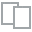
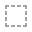
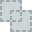
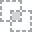
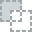
...
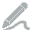
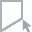
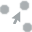
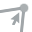
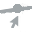

In [25]:
# Initial Rho_x
df = pd.DataFrame(initial_rho_x.numpy(), columns=["initial_rho_x"])
plot(df, "initial_rho_x")

  0%|          | 0/110 [00:00<?, ?it/s]


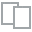
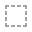
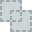
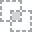
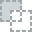
...
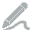
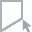
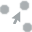
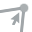
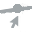

In [26]:
# Final Rho_x
df = pd.DataFrame(output_rho_final["rho_x"].numpy(), columns=["final_rho_x"])
plot(df, "final_rho_x")

In [27]:
Rhat, Rhat01, Rhat10, Rhat11, m01, m10, m11, rho_x, phat, qhat, phi = \
        list(map(
            lambda x: output_rho_numpy[x],
            ["Rhat", "Rhat01", "Rhat10", "Rhat11", "m01", "m10", "m11", "rho_x", "phat", "qhat", "phi"]
))

# There was an error with matrix multiplication below due to [:, 0] in dEdrho_x; removing dimension and multiplying was giving wrong result (for einsum function, one can take [:, 0] at the end)

In [28]:
def compute_I(psi, X):
    nobs = psi.size
    psi2 = (psi*psi)[:, 0]
    return np.einsum('i, ij, ik -> jk', psi2, X, X)/nobs
    
    
def compute_deriv_E_rho(Rhat, Rhat01, Rhat10, Rhat11, m01, m10, m11, rho_x, phat, qhat, y_1, y_2, w):
    
    #m = weights*((y_1-phat)*(y_2-qhat)-rho_x*Rhat)
    
    a = w*Rhat
    b = (Rhat01**2) + (Rhat10**2) + (Rhat11**2)
    c =   w*Rhat + Rhat01*m01 + Rhat10*m10 + Rhat11*m11# WRONG
    #c =   (w*Rhat**2 + Rhat01*m01 + Rhat10*m10 + Rhat11*m11) # NO RHAT
    d = w*(y_1-phat)*(y_2-qhat)
    #d = m # change like in Salanie
    #d = w*(y_1-phat)*(y_2-qhat)*Rhat

    #rho2 = rho_x*rho_x
    #rho4 = rho2*rho2

    #der = c + 2.0*d*rho_x - 3.0*c*rho2 + 2.0*b*d*rho_x - b*c*rho2 - b*c*rho4 # Original

    #der = ((c-w*Rhat+w*Rhat**2)/Rhat -  + 2.0*d*rho_x - 3.0*c*rho2 + 2.0*b*d*rho_x - b*c*rho2 - b*c*rho4

    #der * a / ((1 + (b/Rhat)*rho2)**2)
    #Rhat**2 * der * a / ((Rhat + b*rho2)**2)

    #der = a*(c*(1+rho_x**2*b)-a*(rho_x*c-d)*2*rho_x*b)/(1+rho_x**2*b)**2  #NOW
    #der = a*(c*(Rhat**2+rho_x**2*b)-a*(rho_x*c-d)*2*rho_x*b)/(Rhat**2+rho_x**2*b)**2  NOW
        
    der = a*(c-c*b*rho_x**2+2*rho_x*b*d)/(1+rho_x**2*b)**2

    return der
    #Rhat*(Rhat**2* cpp + Rhat**3* 2.0*d*rho_x - 3.0*Rhat**2* cpp*rho2 + 2.0*b*d*rho_x*Rhat - b*cpp*rho2 - b*cpp*rho4)  * a / (Rhat**2 + b*rho_x**2)**2
    


def compute_J(X, dEdrho):
    nobs = X.shape[0]
    return np.einsum('i, ij, ik -> jk', dEdrho[:, 0], X, X)/nobs


I = compute_I(phi, X_svd)
dEdrho = compute_deriv_E_rho(Rhat, Rhat01, Rhat10, Rhat11, m01, m10, m11, rho_x, phat, qhat, y_1, y_2, weights)
J = compute_J(X_svd, dEdrho)

And all  the eigenvalues of $I$ are all positive, those of $J$ too:

In [29]:
np.column_stack((np.linalg.eig(I)[0], np.linalg.eig(J)[0]))


array([[3.61306090e-05, 6.46959615e-03],
       [8.12538613e-06, 1.94980914e-03],
       [5.06758292e-06, 9.33234000e-04],
       [4.16795750e-06, 8.36684834e-04],
       [3.89888849e-06, 6.57303751e-04],
       [3.43308951e-06, 5.78400056e-04],
       [3.21136591e-06, 5.68871712e-04],
       [2.75941763e-06, 5.12766223e-04],
       [2.50950396e-06, 4.81523888e-04],
       [2.19577988e-06, 4.58846136e-04],
       [2.12485646e-06, 4.12568040e-04],
       [1.86231595e-06, 4.08324466e-04],
       [1.53358480e-06, 3.91648780e-04],
       [1.49329790e-06, 3.82873295e-04],
       [1.39572789e-06, 3.77107319e-04],
       [1.23488340e-06, 3.41591355e-04],
       [1.19449499e-06, 3.44942772e-04],
       [1.11035338e-06, 3.31784765e-04],
       [1.07242392e-06, 3.20120453e-04],
       [1.01203290e-06, 3.00414622e-04],
       [9.11567311e-07, 2.88185436e-04],
       [7.79814929e-07, 2.78946749e-04],
       [7.24719505e-07, 2.63030687e-04],
       [6.94039389e-07, 2.55380986e-04],
       [6.538041

The derivative looks nice too.

  0%|          | 0/110 [00:00<?, ?it/s]


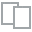
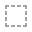
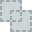
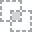
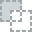
...
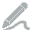
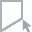
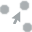
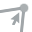
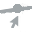

In [30]:
df['dEdrho'] = dEdrho
plot(df, 'dEdrho')

**This is now unnecessary**

this can be avoided by going back to how we get our estimator of $\beta$, that is by minimizing $F(\beta)=\frac12 \sum_k Q_k(\beta)^2$ with
$$
Q_k(\beta) = \frac1n \sum_i H_i(\beta) X_{ik};
$$
then 
$$
\frac{\partial F}{\partial \beta_l}= \sum_k Q_k \frac{\partial Q_k}{\partial \beta_l}
= \frac1n \sum_i \frac{\partial H_i}{\partial\beta_l} \bar{Q}_i
$$
with $\bar{Q}_i=\sum_k Q_k X_{ik}$  and  we can compute 
$$
I_{lm} = \frac1n \sum_i (\bar{Q}_i)^2 \frac{\partial H_i}{\partial\beta_l} \frac{\partial H_i}{\partial\beta_m}
$$
and 
$$
J_{lm} = \frac1n \sum_i  \left(\frac{\partial^2 H_i}{\partial\beta_l \partial\beta_m} \bar{Q}_i
+ \frac{\partial H_i}{\partial\beta_l} \left(\frac1n \sum_j  \sum_k X_{ik} X_{jk} \frac{\partial H_j}{\partial\beta_m}\right)\right),
$$
using
$$
 \frac{\partial Q_k}{\partial \beta_m} = \frac1n \sum_j X_{jk} \frac{\partial H_j}{\partial\beta_m}.
$$

The above *must* work---I am not doing it because I am not sure I can find the right bits of data. Moving on with the implementation of the test.

In [31]:
samples = X.shape[0]
K = I.shape[0]

# I am using inv_J * I * inv_J now  
inverse_J = np.linalg.inv(J)
sandwich = inverse_J @ I @ inverse_J

VB = sandwich/samples

sqrtVB = scipy.linalg.sqrtm(VB) # Matrix square root
stderr_beta = np.diagonal(sqrtVB)

print("Standard errors of estimated beta:")
print(stderr_beta)

Standard errors of estimated beta:
[0.0447574  0.04697973 0.04555927 0.04377734 0.05254082 0.07653594
 0.03551619 0.0430861  0.11605978 0.09842067 0.13090098 0.05908854
 0.08052921 0.05681591 0.07625266 0.05424634 0.0468972  0.04703178
 0.05600457 0.05450979 0.04966899 0.07457454 0.05048251 0.05497827
 0.05834255 0.05512265 0.04920272 0.05058414 0.05682221 0.05873856
 0.05080887 0.04829908 0.0497707  0.05651813 0.06200887 0.07110889
 0.06409412 0.06882893 0.06402974 0.04245258 0.05093615 0.03404145
 0.04447439 0.0388846  0.03974749 0.0554223  0.07431982 0.02830704
 0.03719601 0.0515363 ]


In [32]:
#if p["models_layers_and_parameters"]["rho"]["linear_or_logit"] == "logit":
#    deriv_rho = (1/2)*(1-rho_x)*(1+rho_x)
#else:
deriv_rho = np.full_like(rho_x, 1.0)
deriv_rho_square = deriv_rho*deriv_rho

# variance and standard error of estimated rho at each sample point
V_ro_x = np.einsum('i, ik, kl, il -> i', deriv_rho_square[:, 0], X, VB, X)
sigma_ro_x = np.sqrt(V_ro_x)

  0%|          | 0/10 [00:00<?, ?it/s]


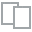
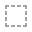
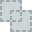
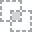
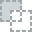
...
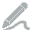
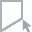
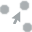
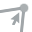
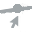

In [33]:
df['stderr_rho_x'] = sigma_ro_x
df['rho_x'] = rho_x
plot(df, 'rho_x', 'stderr_rho_x')

Looks good still.

In [34]:
# The test starts
gamma_n = 1 - 0.1 / np.log(samples)
NDRAWS = 1000
nu = np.random.normal(size=(NDRAWS, K)) # Random N(0, 1) draws, N by K matrix

Below, it does not really matter which square root we use as long as we preserve the norm of $h$. Your choice is fine.

In [35]:
sqrt_nobs =  np.sqrt(samples)
h_values = sqrt_nobs * (X @ sqrtVB) * deriv_rho.reshape((-1, 1))
h_norms = np.sqrt(np.sum(h_values*h_values, 1, keepdims=True))+1e-9

In [36]:
# now we compute the h'nu/h_norm ratio and we take the sups over x
h_ratios = (h_values @ nu.T)/h_norms
h_sups = np.max(h_ratios, 0)

# and the gamma_n quantile
k0 = np.quantile(h_sups, gamma_n)
print(f"k0 is {k0}")

k0 is 4.478714174315462


In [37]:
# we filter the x's 
#rho_corr = rho_x + k0*h_norms/sqrt_nobs
#upper_bd = np.min(rho_corr) 
#x_in_Ahat = np.squeeze(rho_x - 2.0*k0*h_norms/sqrt_nobs <  upper_bd, axis=1)

# New
left = rho_x
right = np.amax(rho_x-k0*h_norms/sqrt_nobs) - 2*k0*h_norms/sqrt_nobs
x_in_Ahat = np.squeeze(left > right, axis=1)
print(f"Ahat has  {np.sum(x_in_Ahat)} elements.")

Ahat has  6330 elements.


Now we take the ratios, but only on $\hat{A}$, and we select the 90th or the 95th or the 99th percentile:

In [38]:
h_ratios2 = h_ratios[x_in_Ahat]
h_sups2 = np.max(h_ratios2, 0)
k90 = np.quantile(h_sups, 0.90)
k95 = np.quantile(h_sups, 0.95)
k99 = np.quantile(h_sups, 0.99)
print(f"k is {k90} at 10% level, {k95} at 5% level, {k99} at 1%")

k is 3.90004983925099 at 10% level, 4.132896289352657 at 5% level, 4.507528466052289 at 1%


And we finally get $\bar{\rho}$:

In [39]:
#Old
#rho_bar90 = np.min(rho_x + k90 * sigma_ro_x)
#rho_bar95 = np.min(rho_x + k95 * sigma_ro_x)
#rho_bar99 = np.min(rho_x + k99 * sigma_ro_x)
rho_bar90 = np.max(rho_x - k90 * sigma_ro_x)
rho_bar95 = np.max(rho_x - k95 * sigma_ro_x)
rho_bar99 = np.max(rho_x - k99 * sigma_ro_x)
#print(f"rho_x is {rho_x}")
#print(f"sigma_ro_x is {sigma_ro_x}")
print(f"rho_bar is {rho_bar90} at 10% level, {rho_bar95} at 5% level, {rho_bar99} at 1%")

rho_bar is 0.05382190623483307 at 10% level, 0.03904333642184582 at 5% level, 0.015265744901212852 at 1%


In [40]:
from statsmodels.nonparametric._kernel_base import EstimatorSettings
from statsmodels.nonparametric.kernel_regression import KernelReg

def reg_nonpar(y: np.array, X: np.array, var_types: str = 'u',
               n_sub: int = None, n_res: int = 1):
    """
    nonparametric regression of y on the columns of X;
    bandwidth chosen on a subsample of size nsub if nsub < nobs, and rescaled

    :param np.array y: a vector of size nobs

    :param np.array X: a (nobs) vector or a matrix of shape (nobs, m)

    :param str var_types: specify types of all `X` variables if not all of them are continuous; \
     one character per variable

      * 'c' for continuous
      * 'u' discrete unordered
      * 'o' discrete ordered

    :param n_sub: size of subsample for cross-validation;  by default it is :math:`200^{(m+4)/5}`

    :param int n_res: how many subsamples we draw; 1 by default

    :return: fitted on sample (nobs, with derivatives)  and bandwidths (m)
    """
    assert X.ndim == 1 or X.ndim == 2, "X should be a vector or a matrix"
    assert y.ndim == 1, "y should be a vector"
    n_obs = y.size
    assert X.shape[0] == n_obs, "X and y should have the same number of observations"
    m = 1 if X.ndim == 1 else X.shape[1]
    if var_types is None:
        types = 'c' * m
    else:
        assert len(var_types) == m, \
            "var_types should have one entry for each column of X"
        types = var_types

    if n_sub is None:
        n_sub = round(200**((m+4.0)/5.0))

    k = KernelReg(y, X, var_type=types,
                  defaults=EstimatorSettings(efficient=True, n_sub=n_sub,
                                             randomize=True, n_res=n_res))
    
    return k.fit(), k.bw


def reg_nonpar_fit(y: np.array, X: np.array, var_types: str = 'u',
                   n_sub: int = None, n_res: int=1,
                   verbose: bool=False) -> np.array:
    """
    nonparametric regression of y on the columns of X; bandwidth chosen on a subsample of size nsub if nsub < nobs, and rescaled

    :param np.array y: a vector of size nobs

    :param np.array X: a (nobs) vector or a matrix of shape (nobs, m)

    :param str var_types: specify types of all `X` variables if not all of them are continuous; \
     one character per variable

      * 'c' for continuous
      * 'u' discrete unordered
      * 'o' discrete ordered

    :param n_sub: size of subsample for cross-validation; by default it is :math:`200^{(m+4)/5}`

    :param int n_res: how many subsamples we draw; 1 by default

    :param bool verbose: prints stuff if True

    :return: fitted on sample (nobs)
    """
    kfbw = reg_nonpar(y, X, var_types, n_sub, n_res)
    return kfbw[0][0]

In [41]:
def stackplot(y, title, label, labels=None):
    
    values = list(set(y))
    values.sort()
    #print(values)
    output_list = []
    sorted_rho_x = np.sort(np.squeeze(rho_x, axis=1), axis=0)
    sorted_rho_x = sorted_rho_x[np.abs(sorted_rho_x) < 0.2]
    for val in values:
        y_equal_to_val = y == val
        output = reg_nonpar_fit(y=y_equal_to_val, X=rho_x, var_types="c")
        combined = list(zip(list(rho_x), list(output)))
        combined = list(filter(lambda xy: abs(xy[0])<0.2, combined))
        combined.sort(key=lambda xy: xy[0])
        output_list.append(np.expand_dims(np.array(list(map(lambda xy: xy[1], combined))), axis=0))

    output_stacked = np.concatenate(output_list, axis=0)
    amin_output_stacked = np.minimum(np.amin(output_stacked, axis=0, keepdims=True), 0)
    sum_output_stacked = np.sum(output_stacked, axis=0, keepdims=True)
    
    output_stacked = (output_stacked - amin_output_stacked)# / (sum_output_stacked - amin_output_stacked)
    output_stacked /= np.sum(output_stacked, axis=0, keepdims=True)
    
    plt.rcParams['font.size'] = 8
    fig, ax = plt.subplots()
    if labels is None:
        labels = list(map(lambda x: label + " = " + str(x), values))
    #plt.title(title)
    plt.stackplot(sorted_rho_x, output_stacked, labels=labels)
    plt.xlabel("\u03C1")
    plt.ylabel("Fraction predicted")
    ax.legend(loc='upper right')

Text(0, 0.5, 'Y')

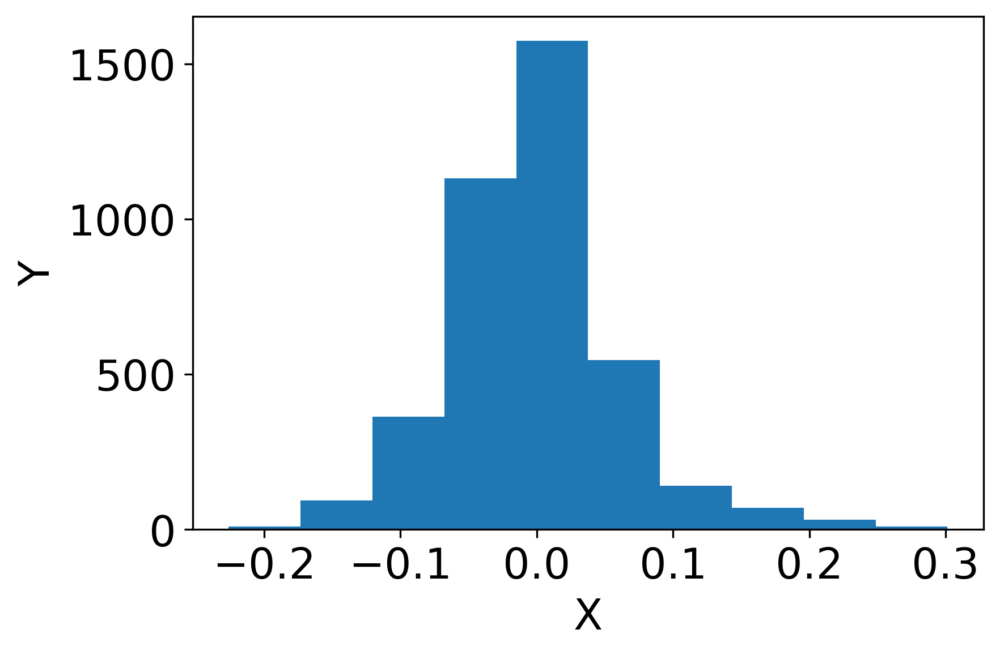

In [42]:
hom = data[:,23]
plt.hist(rho_x[hom==1])
#plt.title("Write the title")
plt.xlabel("X")
plt.ylabel("Y")

Text(0, 0.5, 'Y')

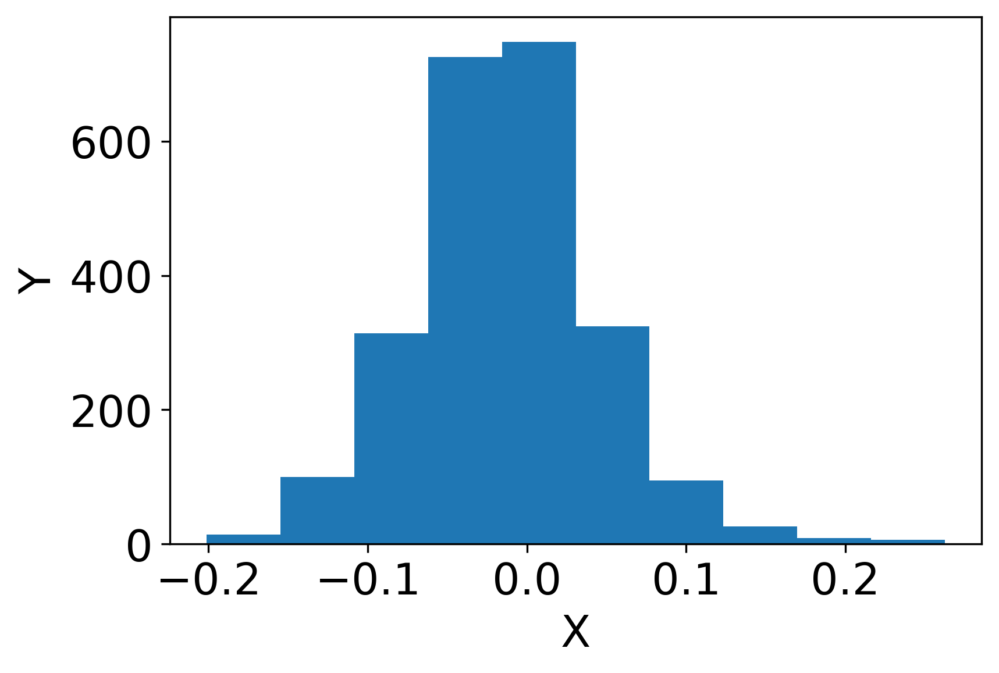

In [43]:
plt.hist(rho_x[hom==0])
#plt.title("Write the title")
plt.xlabel("X")
plt.ylabel("Y")

In [44]:
# Save the parameters
for model_name in p["models_layers_and_parameters"].keys():
    try:
        p["models_layers_and_parameters"][model_name]["make_nn_layers"] = \
        p["models_layers_and_parameters"][model_name]["make_nn_layers"]().to_json()
    except:
        pass
    try:
        p["models_layers_and_parameters"][model_name]["optimizer"] = \
        tf.keras.optimizers.serialize(p["models_layers_and_parameters"][model_name]["optimizer"])
    except:
        pass
    
import os
if not os.path.isdir(OUTPUT_FOLDER):
    os.mkdir(OUTPUT_FOLDER)

with open(OUTPUT_FOLDER+PARAMETERS+".pkl", 'wb+') as handle:
    pickle.dump(p, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [45]:
data[:, 43]

array([2., 3., 7., ..., 2., 2., 2.])

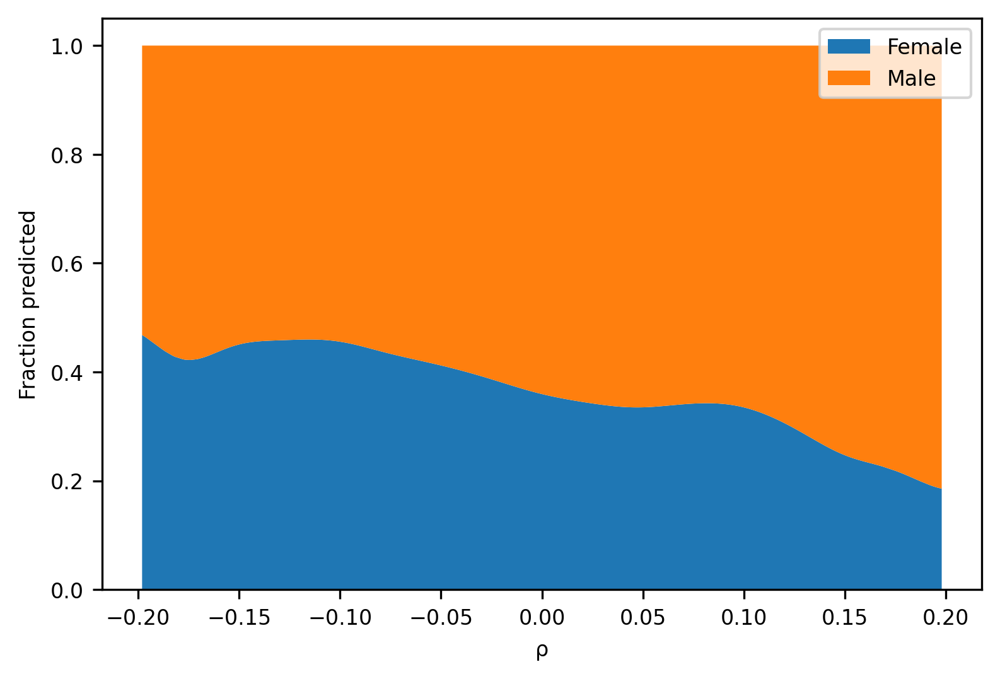

In [46]:
hom = data[:, 23]
stackplot(hom, "Estimated \u03C1 by gender", "Hom", labels=[
    "Female",
    "Male",
])

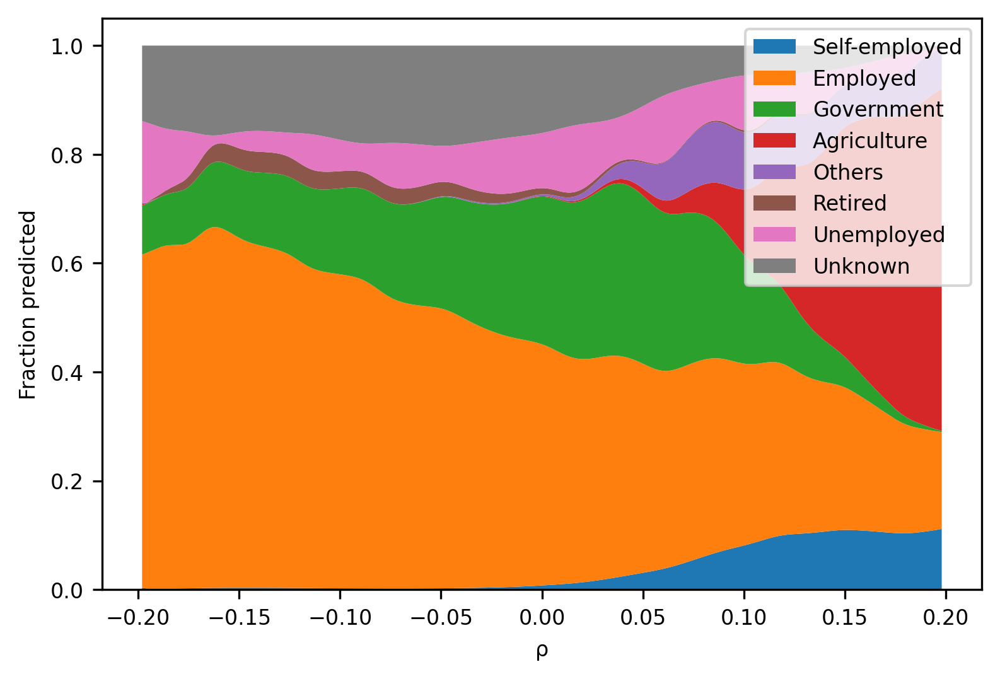

In [47]:
prof = data[:, 43]
stackplot(prof, "Estimated \u03C1 by profession", None, labels=[
    "Self-employed",
    "Employed",
    "Government",
    "Agriculture",
    "Others",
    "Retired",
    "Unemployed",
    "Unknown"
])
    

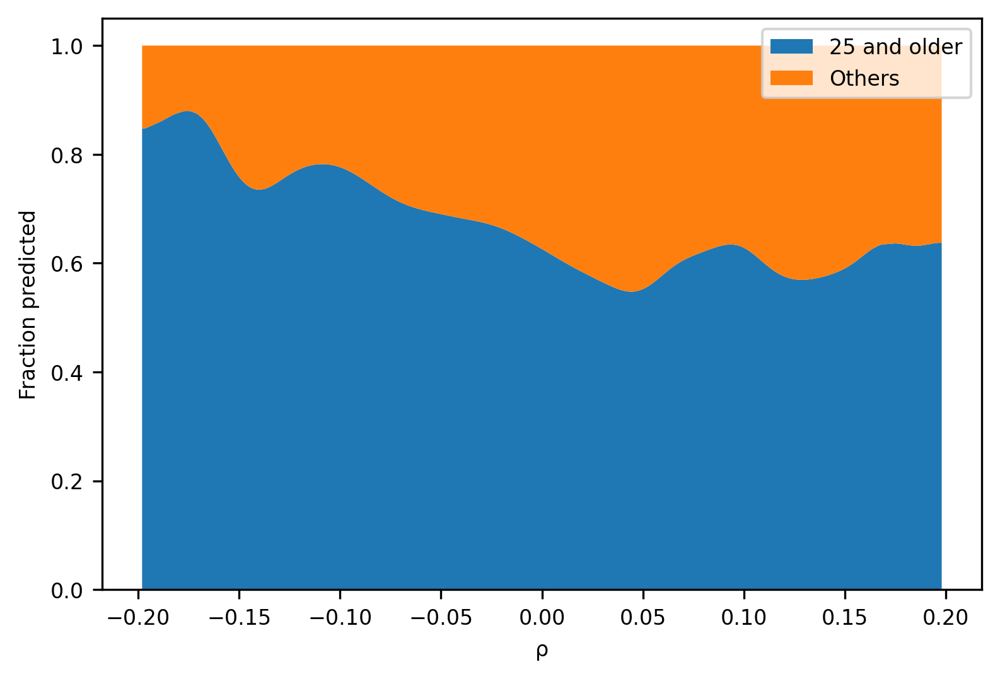

In [48]:
age = (data[:, 0]==2).astype(np.float64)
stackplot(age, "Estimated \u03C1 by age", None, labels=[
    "25 and older",
    "Others"
])

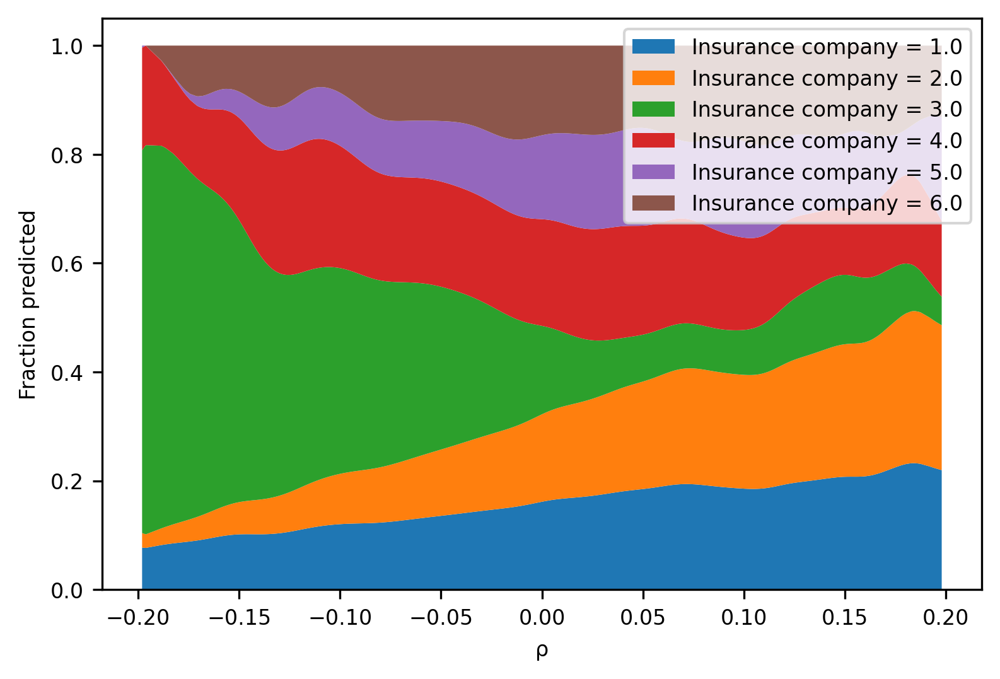

In [49]:
group = data[:, 21] # 
stackplot(group, "Estimated \u03C1 by insurance company", "Insurance company")

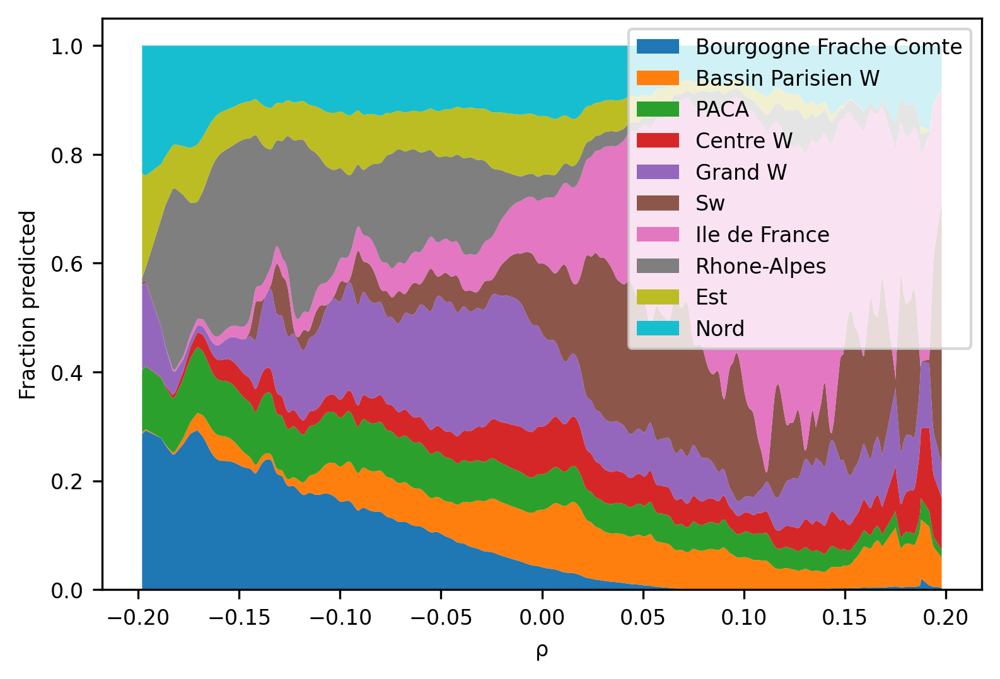

In [50]:
reg = data[:, 46] #
stackplot(reg, "Estimated \u03C1 by region", None, labels=[
    "Bourgogne Frache Comte",
    "Bassin Parisien W",
    "PACA",
    "Centre W",
    "Grand W",
    "Sw",
    "Ile de France",
    "Rhone-Alpes",
    "Est",
    "Nord"
])
    

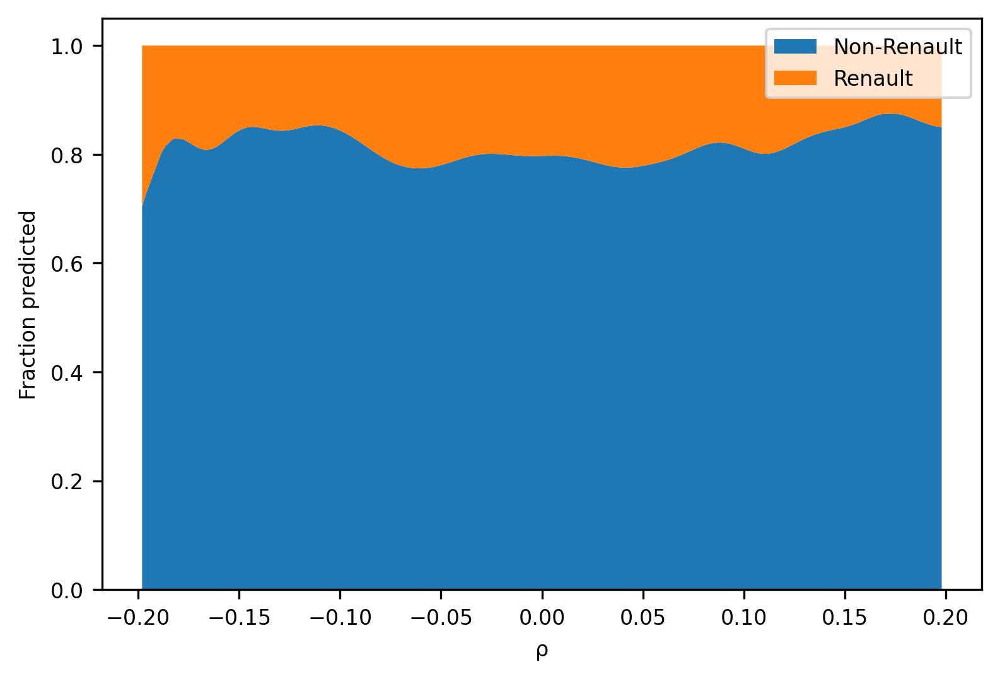

In [51]:
rena = data[:, 47]
stackplot(rena, "Estimated \u03C1 car maker", None, labels=[
    "Non-Renault",
    "Renault",
])

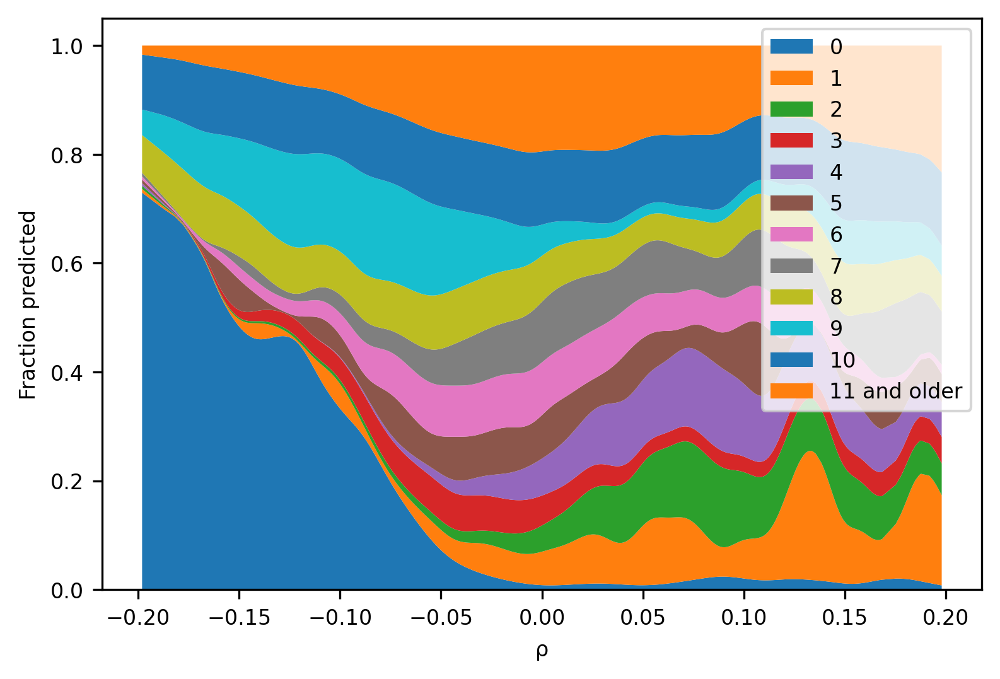

In [52]:
tracir = data[:, 52]
stackplot(tracir, "Estimated \u03C1 by vehicle age", "tracir", labels=[
     # tracir 1
    "0",
    "1",
    "2",
    "3",
    "4",
    "5",
    "6",
    "7",
    "8",
    "9",
    "10",
    "11 and older"# tracir 11
])

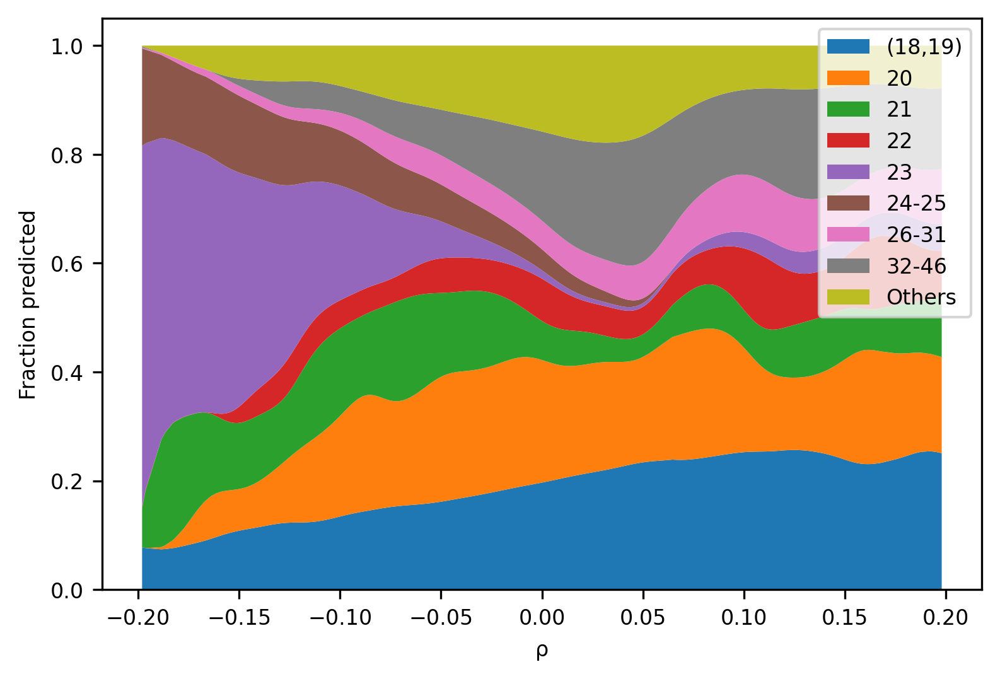

In [53]:
trage = data[:, 53] # 
stackplot(trage, "Estimated \u03C1 by age of the driver", "trage", labels=[
    "(18,19)",
    "20",
    "21",
    "22",
    "23",
    "24-25",
    "26-31",
    "32-46",
    "Others"
])

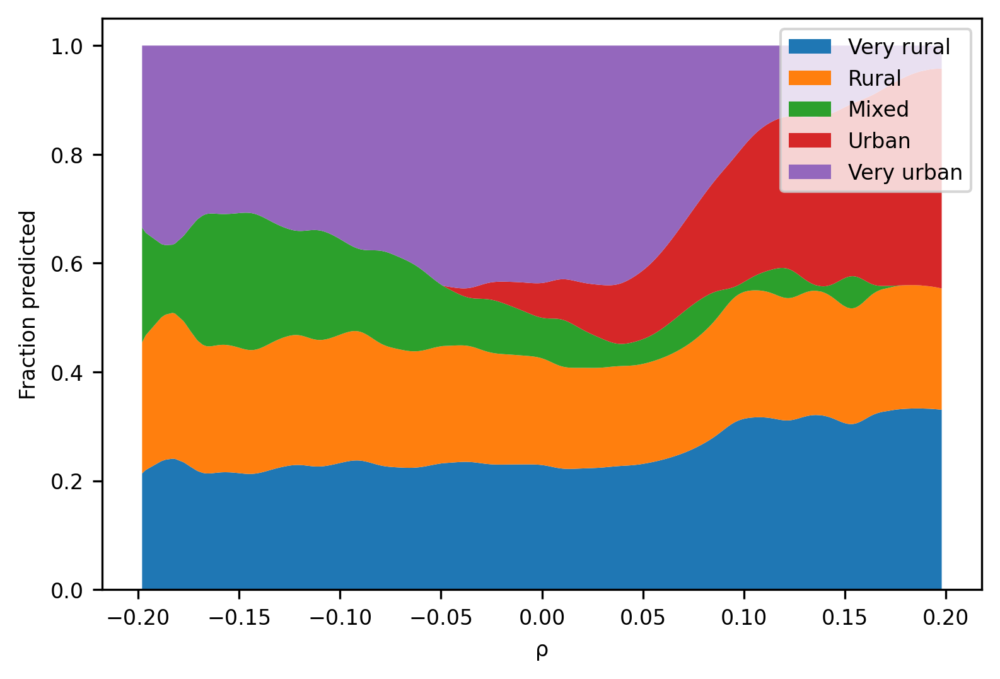

In [54]:
zone = data[:, 57] #
stackplot(zone, "Estimated \u03C1 by zone", "zone", labels=[
    "Very rural",
    "Rural",
    "Mixed",
    "Urban",
    "Very urban"
])

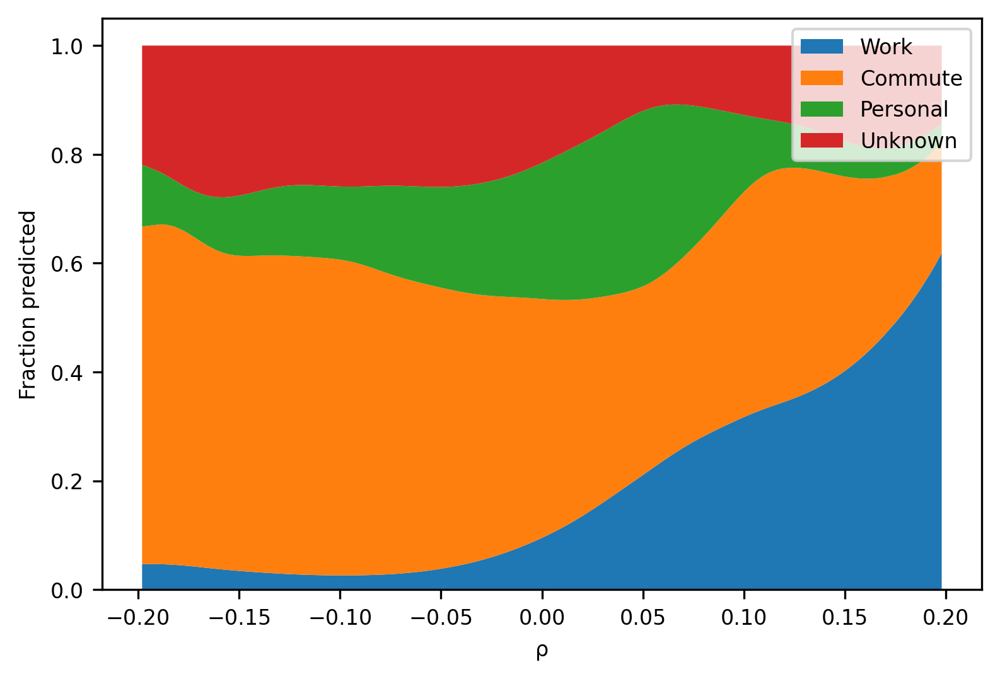

In [55]:
usag = data[:,56] # 
stackplot(usag, "Estimated \u03C1 by car usage", "usag", labels=[
    "Work",
    "Commute",
    "Personal",
    "Unknown"
])

In [56]:
%%javascript
IPython.notebook.save_notebook()

<IPython.core.display.Javascript object>

In [57]:
if platform in ["linux", "linux2", "darwin"]: # Only on linux
    # ! pip install wkhtmltopdf # if needed
    THIS_NOTEBOOK_NAME = "Main_variable_rho"
    THIS_NOTEBOOK_NAME_IPYNB = THIS_NOTEBOOK_NAME+".ipynb"
    THIS_NOTEBOOK_NAME_HTML = THIS_NOTEBOOK_NAME+".html"
    THIS_NOTEBOOK_NAME_PDF = THIS_NOTEBOOK_NAME+".pdf"

    FULL_NOTEBOOK_HTML_PATH = OUTPUT_FOLDER+VARIABLE_RHO_NOTEBOOK_PATH_NO_EXTENSION+".html"
    FULL_NOTEBOOK_PDF_PATH = PDF_FOLDER+p["experiment_name"]+DASHES+VARIABLE_RHO_NOTEBOOK_PATH_NO_EXTENSION+".pdf"
    ! jupyter nbconvert --to html $THIS_NOTEBOOK_NAME_IPYNB 
    ! wkhtmltopdf $THIS_NOTEBOOK_NAME_HTML $THIS_NOTEBOOK_NAME_PDF
    ! mv $THIS_NOTEBOOK_NAME_HTML $FULL_NOTEBOOK_HTML_PATH
    ! mv $THIS_NOTEBOOK_NAME_PDF $FULL_NOTEBOOK_PDF_PATH

[NbConvertApp] Converting notebook Main_variable_rho.ipynb to html
[NbConvertApp] Writing 9977517 bytes to Main_variable_rho.html
Loading page (1/2)
Printing pages (2/2)                                               
Done                                                           
